# Conférences Python Master TIDE #6

**Dataviz avec plotly express**

1. **Réduction de dimensions**
2. **Cartes proportionnelles**
3. **Cartes géographiques**
4. **Divers**


&copy; 2025 Francis Wolinski

In [ ]:
#!pip install plotly

In [1]:
# imports
import numpy as np
import pandas as pd
import plotly.express as px

Il peut être nécessaire de fixer le moteur de rendu de **plotly** avec l'instruction suivante en en choisissant un parmi la liste fournie.

In [2]:
# renderers
import plotly.io as pio
print(pio.renderers)
pio.renderers.default = 'jupyterlab'

Renderers configuration
-----------------------
    Default renderer: 'plotly_mimetype'
    Available renderers:
        ['plotly_mimetype', 'jupyterlab', 'nteract', 'vscode',
         'notebook', 'notebook_connected', 'kaggle', 'azure', 'colab',
         'cocalc', 'databricks', 'json', 'png', 'jpeg', 'jpg', 'svg',
         'pdf', 'browser', 'firefox', 'chrome', 'chromium', 'iframe',
         'iframe_connected', 'sphinx_gallery', 'sphinx_gallery_png']



Les graphiques sont produits avec une barre d'outils offrant différentes fonctions (snapshot, zoom, sélection, recentrage...).

Il est possible de masquer ce menu avec l'instruction :
```python
fig.show(config={'displayModeBar': False})
```

Les options de configuration sont explicitée dans cette page : https://plotly.com/python/configuration-options/

#### Correspondances matplotlib / seaborn / plotly (extrait)

matplotlib|seaborn|plotly
-|-|-
bar|barplot|bar
pie|barplot|pie
-|stripplot|strip
scatter|scatterplot|scatter
boxplot|boxplot|box
violinplot|violinplot|violin
hist|displot|histogram
-|pairplot|scatter_matrix
-|joinplot|density_heatmap
-|FacetGrid|paramètres "facet_row" et "facet_col"

### 1. Réduction de dimensions

L'objectif de cette partie est de mettre en oeuvre des algorithmes de réduction de dimension pour visualiser en 2D des données numériques multi-dimensionnelles.

Le jeu de données vient des Nations Unies (UNCTAD) sur les facteurs de développement du e-commerce par pays :
- \% d'individus utilisant Internet, source International Telecommunication Union (ITU)
- \% d'individus avec un compte bancaire (15+), source World Bank
- nombre de serveurs Internet sécurisés par 1 million de personnes, source World Bank
- score de fiabilité postale, source Universal Postal Union (UPU)

Source : https://unctad.org/system/files/official-document/tn_unctad_ict4d17_en.pdf

**Exercice : Préparation des données**
- Charger le jeu de données de e-commerce "./data/e-commerce_index_2020.txt"
- Charger également la page "https://www.geonames.org/countries/" en sélectionnant le DataFrame avec ~250 lignes, ou bien le fichier "./data/GeoNames.html". Attention aux *NA* !
- Effectuer une jointure *inner* entre le dataset e-commerce et les pays. Le résultat a combien de lignes ?
- Utiliser le dictionnaire *mapping* pour transformer la colonne "Economy" du dataset e-commerce et refaites la jointure. Le résultat a combien de lignes ?

In [11]:
ecommerce = pd.read_csv("./data/e-commerce_index_2020.txt", sep=";")
ecommerce

,2020 Rank,Economy,Share of individuals using the Internet (2019 or latest),"Share of individuals with an account (15+, 2017)","Secure Internet servers (normalized, 2019)",UPU postal reliability score (2019 or latest),2020 Index value,Index value change (2019-20data),Rank 2019
0,1,Switzerland,97,98,92,97,95.9,-0.1,2
1,2,Netherlands,96,100,94,93,95.8,-0.7,1
2,3,Denmark,97,100,100,81,94.5,0.2,6
3,4,Singapore,89,98,94,97,94.4,-0.4,3
4,5,United Kingdom,96,96,84,98,93.6,-0.8,4
...,...,...,...,...,...,...,...,...,...
147,148,Dem. Rep. of the Congo,9,26,11,5,12.8,-1.3,147
148,149,Comoros,8,22,18,0,12.0,-1.0,149
149,150,Burundi,3,7,20,3,8.3,-0.7,150
150,151,Chad,7,22,0,0,7.1,-1.4,151


In [7]:
var = pd.read_html("https://www.geonames.org/countries/", na_values="", keep_default_na=False)
type(var)

list

In [5]:
[x.shape for x in var]

[(1, 2), (250, 9)]

In [8]:
pays = var[1]
pays

,ISO-3166 alpha2,ISO-3166 alpha3,ISO-3166 numeric,fips,Country,Capital,Area in km²,Population,Continent
0,AD,AND,20,AN,Andorra,Andorra la Vella,468.0,77006,EU
1,AE,ARE,784,AE,United Arab Emirates,Abu Dhabi,82880.0,9630959,AS
2,AF,AFG,4,AF,Afghanistan,Kabul,647500.0,37172386,AS
3,AG,ATG,28,AC,Antigua and Barbuda,St. John's,443.0,96286,NA
4,AI,AIA,660,AV,Anguilla,The Valley,102.0,13254,NA
...,...,...,...,...,...,...,...,...,...
245,YE,YEM,887,YM,Yemen,Sanaa,527970.0,28498687,AS
246,YT,MYT,175,MF,Mayotte,Mamoudzou,374.0,279471,AF
247,ZA,ZAF,710,SF,South Africa,Pretoria,1219912.0,57779622,AF
248,ZM,ZMB,894,ZA,Zambia,Lusaka,752614.0,17351822,AF


In [10]:
data = pd.merge(ecommerce, pays, left_on="Economy", right_on="Country", how="inner")
data

,2020 Rank,Economy,Share of individuals using the Internet (2019 or latest),"Share of individuals with an account (15+, 2017)","Secure Internet servers (normalized, 2019)",UPU postal reliability score (2019 or latest),2020 Index value,Index value change (2019-20data),Rank 2019,ISO-3166 alpha2,ISO-3166 alpha3,ISO-3166 numeric,fips,Country,Capital,Area in km²,Population,Continent
0,1,Switzerland,97,98,92,97,95.9,-0.1,2,CH,CHE,756,SZ,Switzerland,Bern,41290.0,8516543,EU
1,3,Denmark,97,100,100,81,94.5,0.2,6,DK,DNK,208,DA,Denmark,Copenhagen,43094.0,5797446,EU
2,4,Singapore,89,98,94,97,94.4,-0.4,3,SG,SGP,702,SN,Singapore,Singapore,692.7,5638676,AS
3,5,United Kingdom,96,96,84,98,93.6,-0.8,4,GB,GBR,826,UK,United Kingdom,London,244820.0,66488991,EU
4,6,Germany,93,99,90,91,93.4,0.6,9,DE,DEU,276,GM,Germany,Berlin,357021.0,82927922,EU
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129,146,Sierra Leone,9,20,16,13,14.4,-6.9,137,SL,SLE,694,SL,Sierra Leone,Freetown,71740.0,7650154,AF
130,149,Comoros,8,22,18,0,12.0,-1.0,149,KM,COM,174,CN,Comoros,Moroni,2170.0,832322,AF
131,150,Burundi,3,7,20,3,8.3,-0.7,150,BI,BDI,108,BY,Burundi,Gitega,27830.0,11175378,AF
132,151,Chad,7,22,0,0,7.1,-1.4,151,TD,TCD,148,CD,Chad,N'Djamena,1284000.0,15477751,AF


In [14]:
# mapping entre les noms des pays
mapping = {
    'Bolivia (Plurinational State of)': 'Bolivia',
    'China, Hong Kong SAR': 'Hong Kong',
    'Congo': 'Congo Republic',
    'Cōte d\'Ivoire': 'Ivory Coast',
    'Dem. Rep. of the Congo': 'DR Congo',
    'Iran (Islamic Republic of)': 'Iran',
    'Korea, Republic of': 'North Korea',
    'Lao People\'s Dem. Rep.': 'Laos',
    'Netherlands': 'The Netherlands',
    'Republic of Moldova': 'Moldova',
    'Russian Federation': 'Russia',
    'Syrian Arab Republic': 'Syria',
    'Turkey': 'Türkiye',
    'United Republic of Tanzania': 'Tanzania',
    'United States of America': 'United States',
    'Venezuela (Bolivarian Rep. of)': 'Venezuela',
    'Viet Nam': 'Vietnam',
    'Yemen, Arab Republic': 'Yemen',
}

len(mapping)

18

In [16]:
ecommerce["Economy"].map(mapping).fillna(ecommerce["Economy"])

0          Switzerland
1      The Netherlands
2              Denmark
3            Singapore
4       United Kingdom
            ...       
147           DR Congo
148            Comoros
149            Burundi
150               Chad
151              Niger
Name: Economy, Length: 152, dtype: object

In [18]:
ecommerce["Economy"] = ecommerce["Economy"].apply(lambda x: mapping.get(x, x))

In [19]:
data = pd.merge(ecommerce, pays, left_on="Economy", right_on="Country", how="inner")
data

,2020 Rank,Economy,Share of individuals using the Internet (2019 or latest),"Share of individuals with an account (15+, 2017)","Secure Internet servers (normalized, 2019)",UPU postal reliability score (2019 or latest),2020 Index value,Index value change (2019-20data),Rank 2019,ISO-3166 alpha2,ISO-3166 alpha3,ISO-3166 numeric,fips,Country,Capital,Area in km²,Population,Continent
0,1,Switzerland,97,98,92,97,95.9,-0.1,2,CH,CHE,756,SZ,Switzerland,Bern,41290.0,8516543,EU
1,2,The Netherlands,96,100,94,93,95.8,-0.7,1,NL,NLD,528,NL,The Netherlands,Amsterdam,41526.0,17231017,EU
2,3,Denmark,97,100,100,81,94.5,0.2,6,DK,DNK,208,DA,Denmark,Copenhagen,43094.0,5797446,EU
3,4,Singapore,89,98,94,97,94.4,-0.4,3,SG,SGP,702,SN,Singapore,Singapore,692.7,5638676,AS
4,5,United Kingdom,96,96,84,98,93.6,-0.8,4,GB,GBR,826,UK,United Kingdom,London,244820.0,66488991,EU
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147,148,DR Congo,9,26,11,5,12.8,-1.3,147,CD,COD,180,CG,DR Congo,Kinshasa,2345410.0,84068091,AF
148,149,Comoros,8,22,18,0,12.0,-1.0,149,KM,COM,174,CN,Comoros,Moroni,2170.0,832322,AF
149,150,Burundi,3,7,20,3,8.3,-0.7,150,BI,BDI,108,BY,Burundi,Gitega,27830.0,11175378,AF
150,151,Chad,7,22,0,0,7.1,-1.4,151,TD,TCD,148,CD,Chad,N'Djamena,1284000.0,15477751,AF


**Exercice : Réduction de dimension**

* Sélectionner les données des 4 facteurs de e-commerce.
* Normaliser ces données avec un StandardScaler (dans `sklearn.preprocessing`) avec la méthode `fit_transform()`. On obtient une matrice à 4 colonnes.
* Instancier un `TSNE` (dans `sklearn.manifold`) avec le paramètre `perplexity=8` (lié au nombre de voisins utilisés par l'algorithme), et un `random_state` pour la reproductibilité des résultats.
* Appliquer la méthode `fit_transform()` aux données standardisées. On obtient une matrice à 2 colonnes.
* Fusionner les 2 colonnes obtenues transformées en Series avec les colonnes "Population", "Continent" et "Country" des pays avec la fonction `concat()`. On obtient un DataFrame à cinq colonnes.

In [21]:
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

X = data.iloc[:,2:6]
scaler = StandardScaler()
tsne = TSNE(perplexity=8, random_state=0)
X_std = scaler.fit_transform(X)
X_final = tsne.fit_transform(X_std)
X_final

array([[ 33.99094   , -29.417809  ],
       [ 35.14264   , -28.978502  ],
       [ 36.333683  , -30.765022  ],
       [ 36.982883  , -27.699898  ],
       [ 29.835295  , -26.172056  ],
       [ 33.497932  , -27.295996  ],
       [ 32.257492  , -27.799343  ],
       [ 37.780792  , -26.890026  ],
       [ 28.704845  , -28.332962  ],
       [ 32.555836  , -25.991354  ],
       [ 27.90442   , -26.376654  ],
       [ 36.692062  , -25.681625  ],
       [ 27.834055  , -24.057451  ],
       [ 34.63851   , -25.795015  ],
       [ 27.609062  , -28.77388   ],
       [ 28.779753  , -22.864716  ],
       [ 30.325577  , -23.429644  ],
       [ 25.493744  , -26.148958  ],
       [ 27.337381  , -22.69075   ],
       [ 28.664408  , -21.3584    ],
       [ 23.195686  , -19.842815  ],
       [ 25.129694  ,  -9.568668  ],
       [ 25.5647    , -11.943529  ],
       [ 22.161928  , -19.164005  ],
       [ 24.309687  , -11.912019  ],
       [ 22.077633  , -17.799892  ],
       [ 23.585024  , -10.404323  ],
 

In [22]:
X_final[0]

array([ 33.99094 , -29.417809], dtype=float32)

In [25]:
df = pd.concat([pd.Series(X_final[:,0], name="x"), pd.Series(X_final[:,1], name="y"), data["Population"], data["Continent"], data["Country"]], axis=1)
df

,x,y,Population,Continent,Country
0,33.990940,-29.417809,8516543,EU,Switzerland
1,35.142639,-28.978502,17231017,EU,The Netherlands
2,36.333683,-30.765022,5797446,EU,Denmark
3,36.982883,-27.699898,5638676,AS,Singapore
4,29.835295,-26.172056,66488991,EU,United Kingdom
...,...,...,...,...,...
147,-25.651701,28.870337,84068091,AF,DR Congo
148,-24.334055,29.805695,832322,AF,Comoros
149,-24.837040,32.060726,11175378,AF,Burundi
150,-28.315723,30.303745,15477751,AF,Chad


**Exercice : Affichage**

* Compléter le code ci-dessous pour afficher le résultat.

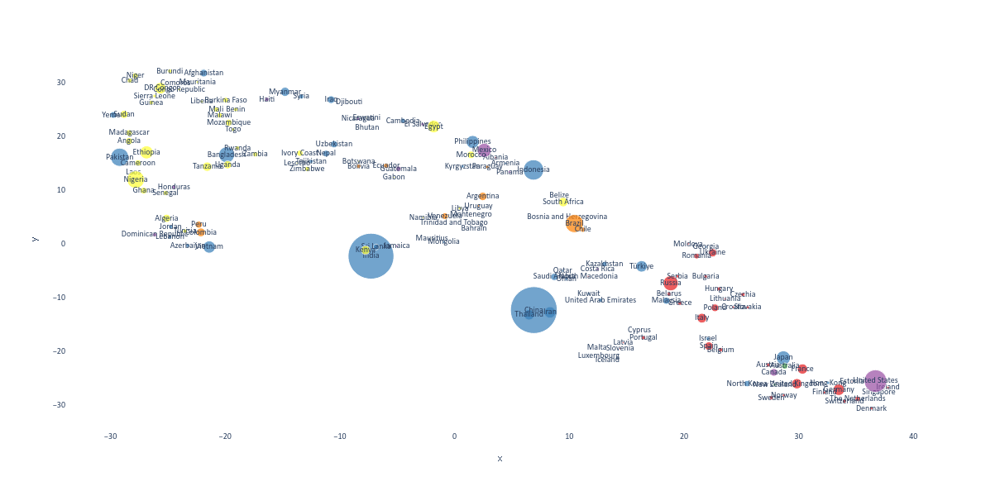

In [26]:
# à vous de jouer
fig = px.scatter(data_frame=df,
           x="x",
           y="y",
           color="Continent",
           size="Population",
           text="Country",
           color_discrete_sequence = px.colors.qualitative.Set1,
           size_max=40)

fig.update_layout(font_size=10,
                  font_family="Calibri",
                  showlegend=False,
                  height=600,
                  plot_bgcolor="white")

**Exercice : Analyse en composantes principales**

* A l'étape 2 instancier un PCA (dans `sklearn.decomposition`) avec le paramètre `n_components=2` et remplacez le TSNE par un PCA.
* Obtenir les composantes de l'ACP (`pca.components_`) ainsi que le % de variance expliquée par composante (`pca.explained_variance_ratio_`)
* Au moment de la fusion des résultats, il faudra peut-être prendre l'opposé de la première colonne numérique, afin d'obtenir un graphique standard avec, à droite, les pays dont les facteurs de e-commerce sont les plus élevés.
* Afficher le résultat.
* Voir également le lien : https://yotta-conseil.fr/Developing_an_Intuition_on_PCA.html

In [29]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

X = data.iloc[:,2:6]
scaler = StandardScaler()
pca = PCA(n_components=2, random_state=0)
X_std = scaler.fit_transform(X)
X_final = pca.fit_transform(X_std)
df = pd.concat([pd.Series(X_final[:,0], name="x"), pd.Series(X_final[:,1], name="y"), data["Population"], data["Continent"], data["Country"]], axis=1)
df

,x,y,Population,Continent,Country
0,2.882657,0.182070,8516543,EU,Switzerland
1,2.891839,0.048680,17231017,EU,The Netherlands
2,2.878123,-0.317772,5797446,EU,Denmark
3,2.784668,0.244632,5638676,AS,Singapore
4,2.668125,0.301963,66488991,EU,United Kingdom
...,...,...,...,...,...
147,-3.000632,0.123667,84068091,AF,DR Congo
148,-3.008628,-0.000724,832322,AF,Comoros
149,-3.293076,0.291946,11175378,AF,Burundi
150,-3.415556,0.144087,15477751,AF,Chad


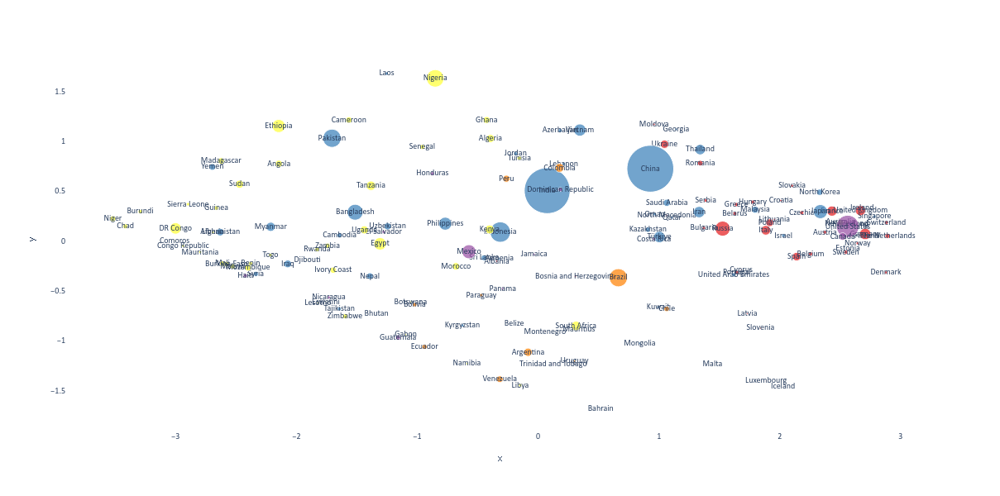

In [30]:
# à vous de jouer
fig = px.scatter(data_frame=df,
           x="x",
           y="y",
           color="Continent",
           size="Population",
           text="Country",
           color_discrete_sequence = px.colors.qualitative.Set1,
           size_max=40)

fig.update_layout(font_size=10,
                  font_family="Calibri",
                  showlegend=False,
                  height=600,
                  plot_bgcolor="white")

In [31]:
pca.explained_variance_ratio_

array([0.80069607, 0.10558033])

In [32]:
pca.components_

array([[ 0.50756565,  0.50619058,  0.52669096,  0.45688602],
       [-0.27877346, -0.32804573, -0.182811  ,  0.88388432]])

### 2. Cartes proportionnelles

Une carte proportionnelle *treemap* (resp. *sunburst*) est une représentation rectangulaire (resp. circulaire) de données hiérarchiques dans un espace limité.

In [3]:
# dataset
fortune = pd.read_csv("./data/Fortune_1000.csv", na_values="-")
fortune = fortune.fillna(0)
fortune.head()

,company,rank,rank_change,revenue,profit,num. of employees,sector,city,state,newcomer,ceo_founder,ceo_woman,profitable,prev_rank,CEO,Website,Ticker,Market Cap
0,Walmart,1,0.0,523964.0,14881.0,2200000,Retailing,Bentonville,AR,no,no,no,yes,1.0,C. Douglas McMillon,https://www.stock.walmart.com,WMT,411690.0
1,Amazon,2,3.0,280522.0,11588.0,798000,Retailing,Seattle,WA,no,yes,no,yes,5.0,Jeffrey P. Bezos,https://www.amazon.com,AMZN,1637405.0
2,Exxon Mobil,3,-1.0,264938.0,14340.0,74900,Energy,Irving,TX,no,no,no,yes,2.0,Darren W. Woods,https://www.exxonmobil.com,XOM,177923.0
3,Apple,4,-1.0,260174.0,55256.0,137000,Technology,Cupertino,CA,no,no,no,yes,3.0,Timothy D. Cook,https://www.apple.com,AAPL,2221176.0
4,CVS Health,5,3.0,256776.0,6634.0,290000,Health Care,Woonsocket,RI,no,no,yes,yes,8.0,Karen S. Lynch,https://www.cvshealth.com,CVS,98496.0


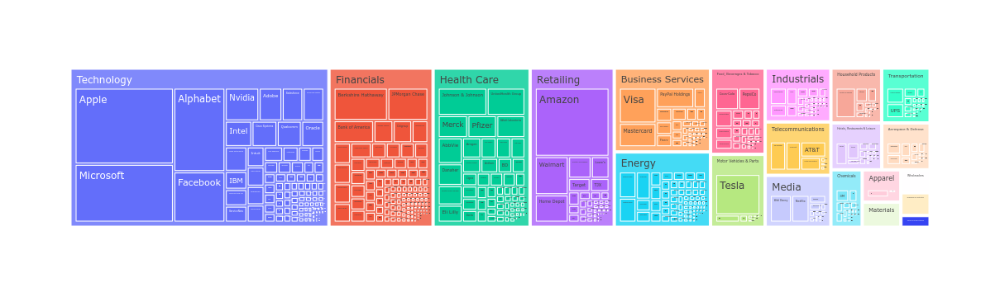

In [34]:
# treemap
px.treemap(fortune,
          path=["sector", "company"],
          values="Market Cap")

**Exercice**

1. *sunburst* avec les 4 plus grandes capitalisations boursières par secteur d'activité.
2. *treemap* avec la hiérarchie à 3 niveaux : état, ville, société avec le nombre d'employés.
3. A partir du fichier "./data/correspondance-code-insee-code-postal.csv", produire une *treemap* avec la hiérarchie à 3 niveaux : Région, Département, Commune avec la Population limitée aux 3 villes les plus peuplées de chaque département.

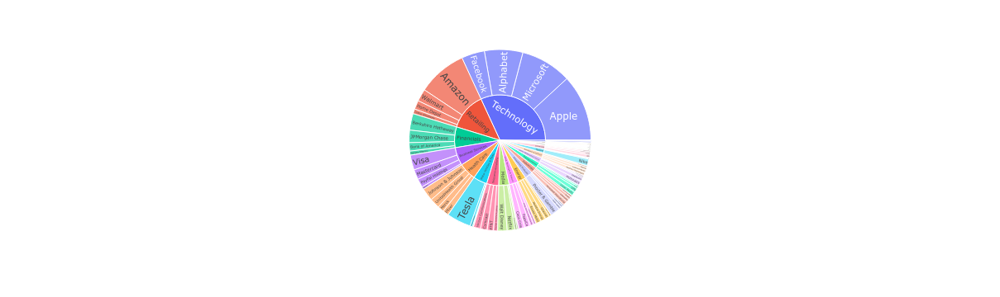

In [44]:
tab = fortune.groupby("sector", as_index=False)[["sector", "company", "Market Cap"]].apply(lambda g: g.nlargest(4, "Market Cap"))
px.sunburst(tab,
            path=["sector", "company"],
           values="Market Cap")

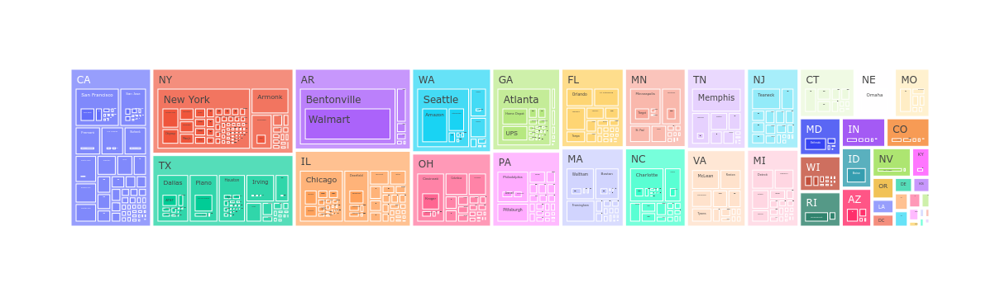

In [43]:
px.treemap(fortune,
           path=["state", "city", "company"],
           values="num. of employees")

### 3. Cartes choroplèthes

Une carte choroplèthe est une carte thématique où les régions sont colorées ou remplies d'un motif qui montre une mesure statistique.

Pour produire une carte choroplèthe, il faut récupérer un fichier *geojson* de la partie du monde considérée. Ce fichier contient entre autres 2 informations importantes :
- Une clé qui désigne chaque sous-région,
- La description d'un polygone ou d'un multi-polygone sous la forme d'une liste de coordonnées (latitude et longitude),

Il faut ensuite faire coïncider les valeurs de la clé du fichier *geojson* avec celles de la colonne du DataFrame qui contient les données relatives à chaque sous-région.

Il est possible ensuite d'utiliser différents types de projections et différents fonds de cartes.

Le fichier "./data/departements.geojson" utilisé ci-après provient du site : https://france-geojson.gregoiredavid.fr/ et il faut analyser le fichier pour trouver la clé correspondant à chaque sous-région.

**Exercice**

Charger le fichier "./data/departements.geojson" avec la librairie **json** dans une variable *departements* qui est un *dict* Python :
- analyser `departements["features"]`,
- sélectionner le premier élément de `departements["features"]` qui est une *list* Python et l'analyser.

Charger le fichier "./data/correspondance-code-insee-code-postal.csv" dans un DataFrame :
- comparer la colonne "Code Département" du DataFrame avec les valeurs accédées par les clés 'properties' et 'code' des éléments de `departements["features"]`,
- produire un DataFrame *df* avec pour chaque "Code Département" la population totale.

In [4]:
import json

with open("./data/departements.geojson") as f:
    departements = json.load(f)

type(departements)

dict

In [6]:
len(departements["features"])

96

In [8]:
departements["features"][0]["properties"]

{'code': '02', 'nom': 'Aisne'}

In [9]:
df = pd.read_csv("./data/correspondance-code-insee-code-postal.csv", sep=";")
df

,Code INSEE,Code Postal,Commune,Département,Région,Statut,Altitude Moyenne,Superficie,Population,geo_point_2d,geo_shape,ID Geogla,Code Commune,Code Canton,Code Arrondissement,Code Département,Code Région
0,31080,31350,BOULOGNE-SUR-GESSE,HAUTE-GARONNE,MIDI-PYRENEES,Chef-lieu canton,301.0,2470.0,1.6,"43.2904403081, 0.650641474176","{""type"": ""Polygon"", ""coordinates"": [[[0.671852...",5761,80,6,2,31,73
1,11143,11510,FEUILLA,AUDE,LANGUEDOC-ROUSSILLON,Commune simple,314.0,2426.0,0.1,"42.9291375888, 2.90138923544","{""type"": ""Polygon"", ""coordinates"": [[[2.906996...",3869,143,30,3,11,91
2,43028,43200,BESSAMOREL,HAUTE-LOIRE,AUVERGNE,Commune simple,888.0,743.0,0.4,"45.1306448726, 4.07952494849","{""type"": ""Polygon"", ""coordinates"": [[[4.091674...",5894,28,29,3,43,83
3,78506,78660,PRUNAY-EN-YVELINES,YVELINES,ILE-DE-FRANCE,Commune simple,155.0,2717.0,0.8,"48.5267627187, 1.80513972814","{""type"": ""Polygon"", ""coordinates"": [[[1.829610...",25381,506,19,2,78,11
4,84081,84310,MORIERES-LES-AVIGNON,VAUCLUSE,PROVENCE-ALPES-COTE D'AZUR,Commune simple,49.0,1042.0,7.6,"43.9337788848, 4.90875878315","{""type"": ""Polygon"", ""coordinates"": [[[4.927176...",29013,81,23,2,84,93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36737,74066,74270,CHAVANNAZ,HAUTE-SAVOIE,RHONE-ALPES,Commune simple,564.0,321.0,0.2,"46.0500384099, 6.01652644319","{""type"": ""Polygon"", ""coordinates"": [[[6.026228...",21528,66,15,3,74,82
36738,67315,67630,NEEWILLER-PRES-LAUTERBOURG,BAS-RHIN,ALSACE,Commune simple,157.0,725.0,0.7,"48.9516989257, 8.11931601006","{""type"": ""Polygon"", ""coordinates"": [[[8.106826...",36113,315,11,7,67,42
36739,07122,07200,LACHAPELLE-SOUS-AUBENAS,ARDECHE,RHONE-ALPES,Commune simple,257.0,1018.0,1.5,"44.5622616562, 4.35906947518","{""type"": ""Polygon"", ""coordinates"": [[[4.356584...",36233,122,3,1,07,82
36740,01026,01380,BAGE-LE-CHATEL,AIN,RHONE-ALPES,Chef-lieu canton,202.0,86.0,0.8,"46.3077069231, 4.92862084189","{""type"": ""Polygon"", ""coordinates"": [[[4.926593...",20455,26,2,2,01,82


In [10]:
df["Code Département"].unique()

array(['31', '11', '43', '78', '84', '80', '40', '17', '61', '59', '04',
       '02', '18', '14', '07', '57', '72', '79', '05', '29', '73', '22',
       '21', '52', '86', '64', '26', '60', '16', '28', '51', '53', '33',
       '25', '62', '42', '85', '74', '2B', '88', '55', '91', '39', '27',
       '66', '56', '46', '77', '30', '70', '87', '71', '08', '34', '35',
       '76', '50', '67', '65', '01', '45', '19', '37', '36', '09', '95',
       '54', '69', '44', '06', '68', '49', '38', '13', '82', '15', '89',
       '41', '2A', '47', '63', '03', '48', '10', '32', '92', '24', '90',
       '58', '81', '23', '83', '12', '97', '75', '94', '93'], dtype=object)

In [13]:
np.array([dico["properties"]["code"] for dico in departements["features"]])

array(['02', '10', '14', '15', '28', '35', '39', '40', '42', '45', '47',
       '55', '61', '62', '63', '67', '68', '76', '89', '93', '04', '05',
       '07', '08', '09', '17', '19', '24', '27', '37', '48', '58', '60',
       '64', '69', '71', '75', '78', '81', '82', '83', '85', '87', '88',
       '92', '03', '06', '11', '2A', '22', '23', '25', '29', '30', '33',
       '36', '38', '51', '52', '57', '65', '66', '73', '74', '77', '84',
       '86', '94', '01', '12', '13', '16', '18', '2B', '21', '26', '31',
       '32', '34', '43', '44', '46', '49', '50', '56', '59', '70', '72',
       '80', '91', '95', '41', '53', '54', '79', '90'], dtype='<U2')

In [15]:
tab = df.groupby("Code Département", as_index=False)["Population"].sum()
tab

,Code Département,Population
0,01,588.8
1,02,541.4
2,03,343.3
3,04,159.0
4,05,135.3
...,...,...
92,92,1561.8
93,93,1515.9
94,94,1318.9
95,95,1168.7


Produire la carte directement en complétant les informations manquantes :
- *data_frame* : le DataFrame,
- *locations* : la colonne avec la clé d'accès dans le DataFrame,
- *color* : la colonne avec la grandeur représentée dans le DataFrame,
- *geojson* : le dictionnaire issu du fichier *geojson*,
- *featureidkey* : les clés d'accès dans le fichier *geojson* (sous la forme d'une chaîne où les clés sont séparées par des `.`)

Les autres informations permettent de paramétrer la carte désirée : nuancier de couleurs, type de carte, zoom, centrage, etc.

Produire également une carte choroplèthe avec la moyenne de l'Altitude Moyenne de chaque département, en utilisant le fond de carte "satellite" et le nuancier "reds".

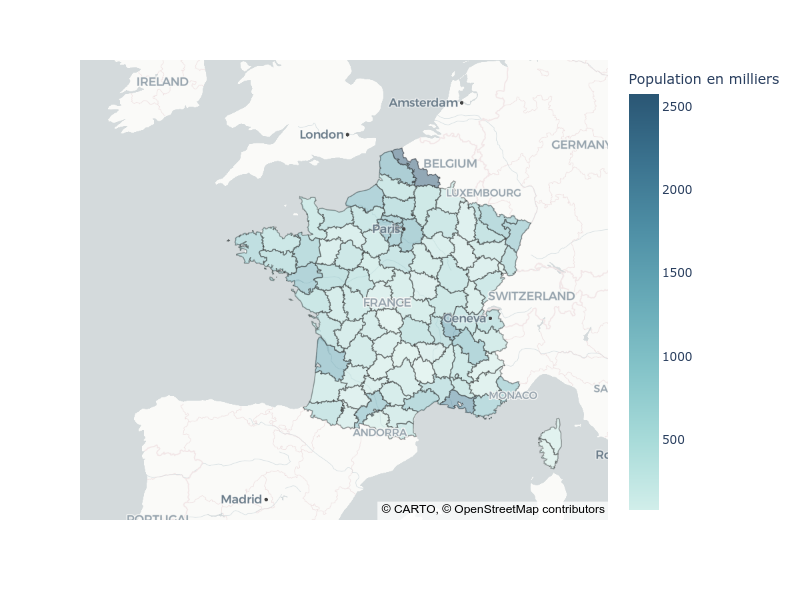

In [20]:
# choropleth_map
px.choropleth_map(data_frame=tab,
                  locations="Code Département",
                  color="Population",
                  geojson=departements,
                  featureidkey="properties.code",
                  color_continuous_scale="teal",
                  map_style="carto-positron",
                  zoom=4.0,
                  center = {"lat": 47.0, "lon": 0.0},
                  opacity=0.5,
                  labels={'Population': 'Population en milliers'},
                  width=800,
                  height=600)


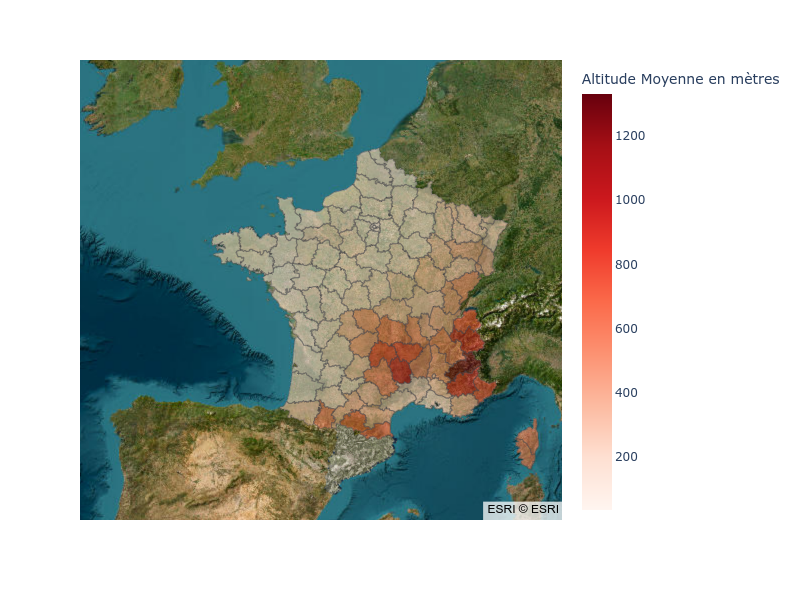

In [23]:
tab2 = df.groupby("Code Département", as_index=False)["Altitude Moyenne"].mean()
# choropleth_map
px.choropleth_map(data_frame=tab2,
                  locations="Code Département",
                  color="Altitude Moyenne",
                  geojson=departements,
                  featureidkey="properties.code",
                  color_continuous_scale="reds",
                  map_style="satellite",
                  zoom=4.0,
                  center = {"lat": 47.0, "lon": 0.0},
                  opacity=0.5,
                  labels={'Altitude Moyenne': 'Altitude Moyenne en mètres'},
                  width=800,
                  height=600)


In [30]:
df["Département"] = df["Département"].str.title()

In [31]:
df["Département"].unique()

array(['Haute-Garonne', 'Aude', 'Haute-Loire', 'Yvelines', 'Vaucluse',
       'Somme', 'Landes', 'Charente-Maritime', 'Orne', 'Nord',
       'Alpes-De-Haute-Provence', 'Aisne', 'Cher', 'Calvados', 'Ardeche',
       'Moselle', 'Sarthe', 'Deux-Sevres', 'Hautes-Alpes', 'Finistere',
       'Savoie', "Cotes-D'Armor", "Cote-D'Or", 'Haute-Marne', 'Vienne',
       'Pyrenees-Atlantiques', 'Drome', 'Oise', 'Charente',
       'Eure-Et-Loir', 'Marne', 'Mayenne', 'Gironde', 'Doubs',
       'Pas-De-Calais', 'Loire', 'Vendee', 'Haute-Savoie', 'Haute-Corse',
       'Vosges', 'Meuse', 'Essonne', 'Jura', 'Eure',
       'Pyrenees-Orientales', 'Morbihan', 'Lot', 'Seine-Et-Marne', 'Gard',
       'Haute-Saone', 'Haute-Vienne', 'Saone-Et-Loire', 'Ardennes',
       'Herault', 'Ille-Et-Vilaine', 'Seine-Maritime', 'Manche',
       'Bas-Rhin', 'Hautes-Pyrenees', 'Ain', 'Loiret', 'Correze',
       'Indre-Et-Loire', 'Indre', 'Ariege', "Val-D'Oise",
       'Meurthe-Et-Moselle', 'Rhone', 'Loire-Atlantique',
       '

In [25]:
np.array([dico["properties"]["nom"] for dico in departements["features"]])

array(['Aisne', 'Aube', 'Calvados', 'Cantal', 'Eure-et-Loir',
       'Ille-et-Vilaine', 'Jura', 'Landes', 'Loire', 'Loiret',
       'Lot-et-Garonne', 'Meuse', 'Orne', 'Pas-de-Calais', 'Puy-de-Dôme',
       'Bas-Rhin', 'Haut-Rhin', 'Seine-Maritime', 'Yonne',
       'Seine-Saint-Denis', 'Alpes-de-Haute-Provence', 'Hautes-Alpes',
       'Ardèche', 'Ardennes', 'Ariège', 'Charente-Maritime', 'Corrèze',
       'Dordogne', 'Eure', 'Indre-et-Loire', 'Lozère', 'Nièvre', 'Oise',
       'Pyrénées-Atlantiques', 'Rhône', 'Saône-et-Loire', 'Paris',
       'Yvelines', 'Tarn', 'Tarn-et-Garonne', 'Var', 'Vendée',
       'Haute-Vienne', 'Vosges', 'Hauts-de-Seine', 'Allier',
       'Alpes-Maritimes', 'Aude', 'Corse-du-Sud', "Côtes-d'Armor",
       'Creuse', 'Doubs', 'Finistère', 'Gard', 'Gironde', 'Indre',
       'Isère', 'Marne', 'Haute-Marne', 'Moselle', 'Hautes-Pyrénées',
       'Pyrénées-Orientales', 'Savoie', 'Haute-Savoie', 'Seine-et-Marne',
       'Vaucluse', 'Vienne', 'Val-de-Marne', 'Ain', 'Avey

In [32]:
tab3 = df.groupby("Département", as_index=False)["Population"].sum()
tab3

,Département,Population
0,Ain,588.8
1,Aisne,541.4
2,Allier,343.3
3,Alpes-De-Haute-Provence,159.0
4,Alpes-Maritimes,1079.6
...,...,...
96,Vendee,625.8
97,Vienne,426.0
98,Vosges,381.1
99,Yonne,343.0


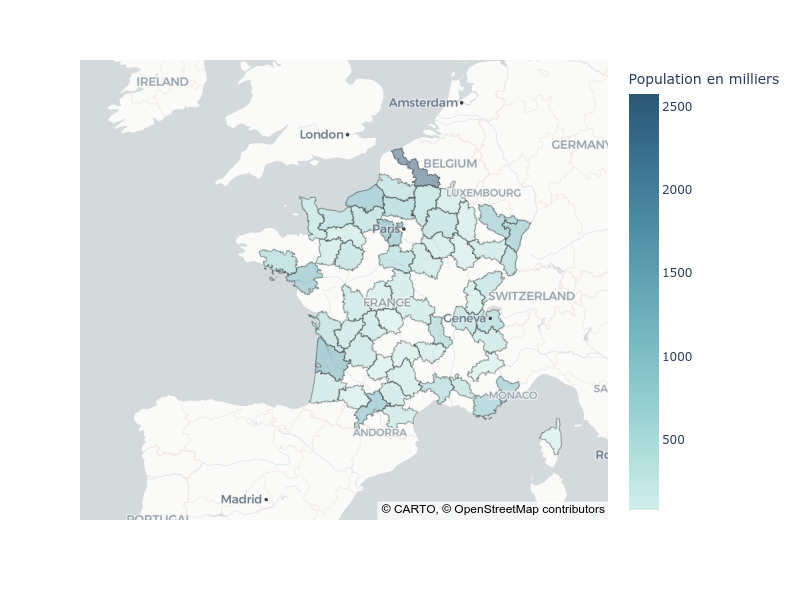

In [33]:
# choropleth_map
px.choropleth_map(data_frame=tab3,
                  locations="Département",
                  color="Population",
                  geojson=departements,
                  featureidkey="properties.nom",
                  color_continuous_scale="teal",
                  map_style="carto-positron",
                  zoom=4.0,
                  center = {"lat": 47.0, "lon": 0.0},
                  opacity=0.5,
                  labels={'Population': 'Population en milliers'},
                  width=800,
                  height=600)

### 4. Divers

La librairie **plotly** permet également de produire des cartes avec un nuage de points.

#### 4.1 Carte avec nuage de points

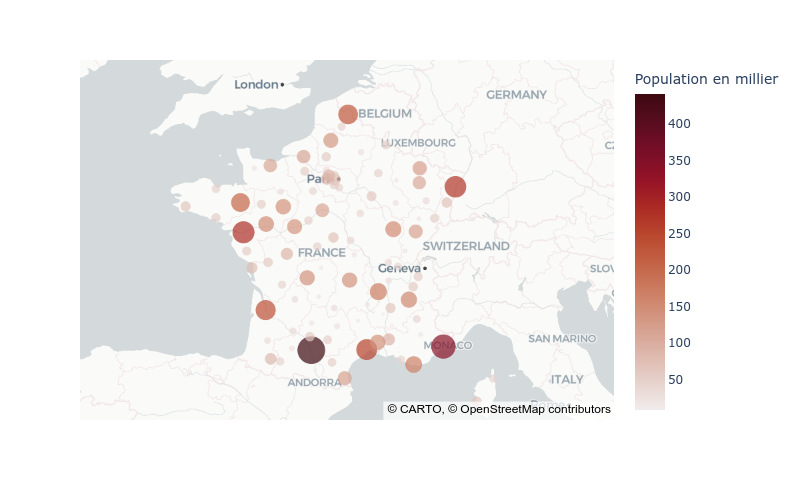

In [34]:
# scatter_map
geo = pd.read_csv("data/correspondance-code-insee-code-postal.csv",
                  sep=";",
                  index_col="Code INSEE",
                  usecols=range(11))

geo[["Latitude", "Longitude"]] = geo["geo_point_2d"].str.extract(r"(.*), (.*)").astype(float)
statut_cat = pd.CategoricalDtype(categories=['Commune simple', 'Sous-préfecture', 'Chef-lieu canton', 'Préfecture', 'Préfecture de région', "Capitale d'état"],
                                 ordered=True)
geo["Statut"] = geo["Statut"].astype(statut_cat)

# on sélection les villes au moins Préfecture
df = geo.loc[geo["Statut"]>="Préfecture"]

px.scatter_map(data_frame=df,
                 lat="Latitude",
                 lon="Longitude",
                 hover_name="Commune",
                 size="Population",
                 color="Population",
                 color_continuous_scale="amp",
                 map_style="carto-positron",
                 zoom=4,
                 center={"lat": 47.0, "lon": 3.0},
                 labels={"Population": "Population en millier"},
                 width=700,
                 height=500)

#### 4.2 Diagramme de Sankey

Un diagramme de Sankey est un type de diagramme de flux dans lequel la largeur des flèches est proportionnelle au flux représenté.

Pour ce type de diagramme, il faut utiliser le module **graph_objects** de la librairie.

Il faut établir la liste unicisée des labels des noeuds à représenter et ensuite produire 3 listes alignées correspondant aux arêtes du graphique :
- *source* : indices des noeuds de départ dans la liste des labels,
- *target* : indices des noeuds d'arrivée dans la liste des labels,
- *value* : valeurs à représenter.

In [35]:
# dataset fortune
fortune[["sector", "state", "company", "Market Cap"]].head()

,sector,state,company,Market Cap
0,Retailing,AR,Walmart,411690.0
1,Retailing,WA,Amazon,1637405.0
2,Energy,TX,Exxon Mobil,177923.0
3,Technology,CA,Apple,2221176.0
4,Health Care,RI,CVS Health,98496.0


In [36]:
# on sélectionne les 4 plus grandes capitalisations des 5 secteurs les plus importants

secteurs = fortune.groupby("sector")["Market Cap"].sum().nlargest(5).index

fortune2 = (fortune
            .loc[fortune["sector"].isin(secteurs)]
            .groupby(["sector"], as_index=False)[["sector", "state", "company", "Market Cap"]]
            .apply(lambda g: g.nlargest(4, "Market Cap"))
            .sort_values(["sector", "state", "Market Cap"], ascending=[True, True, False])
            .reset_index(drop=True)
           )
fortune2

,sector,state,company,Market Cap
0,Business Services,CA,Visa,496377.0
1,Business Services,CA,PayPal Holdings,286198.0
2,Business Services,CA,Square,88370.0
3,Business Services,NY,Mastercard,333881.0
4,Financials,NC,Bank of America,279768.0
5,Financials,NE,Berkshire Hathaway,550878.0
6,Financials,NY,JPMorgan Chase,414465.0
7,Financials,NY,Morgan Stanley,135401.0
8,Health Care,MN,UnitedHealth Group,332885.0
9,Health Care,NJ,Johnson & Johnson,427473.0


In [37]:
# on établit la liste des labels uniques des noeuds à représenter
labels = list(fortune2["sector"].unique()) + list(fortune2["state"].unique())
labels

['Business Services',
 'Financials',
 'Health Care',
 'Retailing',
 'Technology',
 'CA',
 'NY',
 'NC',
 'NE',
 'MN',
 'NJ',
 'AR',
 'GA',
 'WA']

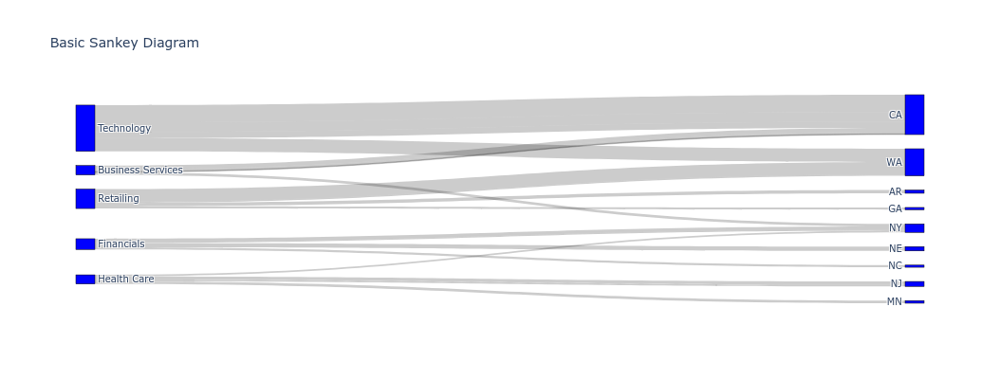

In [38]:
# on produit le diagramme de Sankey
# tout se passe dans la constitution du dictionnaire mis dans l'argument "link"

import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = labels,
      color = "blue"
    ),
    link = dict(
      source = [labels.index(x) for x in fortune2["sector"]],  # indices des noeuds de départ dans la liste des labels
      target = [labels.index(x) for x in fortune2["state"]],  # indices des noeuds d’arrivée dans la liste des labels
      value = fortune2["Market Cap"]  # valeurs à représenter
  ))])

fig.update_layout(title_text="Basic Sankey Diagram", font_size=10, height=400)
fig.show()

**Exercice avec le PLF 2025**

- Charger le fichier "./data/plf25-recettes-du-budget-general.csv" et faire un diagramme de Sankey avec les colonnes "Type de recettes", "Libellé" et "Montant Recettes PLF". Pour simplifier le graphique, il est possible de passer les libellés à "Divers" lorque le montant est inférieur à 1 Milliard (utiliser un `.combine()` avec les colonnes et la fonction adéquates).
- Charger le fichier "./data/plf25-depenses-du-budget-general.csv" et faire un diagramme de Sankey avec les colonnes "Ministère", "Mission" et "AE  PLF". Pour simplifier le graphique, il est possible de sommer les montants à ministère et mission identiques (utiliser un `.groupby()`) avec les colonnes et la fonction adéquates).

Autre exemple : https://huguesg.fr/site/index.php/2024/01/13/visualisation-du-budget-de-letat/

In [44]:
depenses = pd.read_csv("data/plf25-depenses-du-budget-general.csv", sep=";", usecols=["Ministère", "Mission", "AE  PLF"])
depenses = depenses.groupby(["Ministère", "Mission"], as_index=False)["AE  PLF"].sum()
depenses

,Ministère,Mission,AE PLF
0,"Agriculture, souveraineté alimentaire et forêt","Agriculture, alimentation, forêt et affaires r...",4.619628e+09
1,"Agriculture, souveraineté alimentaire et forêt",Développement agricole et rural,1.460000e+08
2,"Agriculture, souveraineté alimentaire et forêt",Enseignement scolaire,1.732853e+09
3,"Agriculture, souveraineté alimentaire et forêt",Recherche et enseignement supérieur,4.336200e+08
4,Armées et anciens combattants,"Anciens combattants, mémoire et liens avec la ...",1.816528e+09
...,...,...,...
57,"Économie, finances et industrie",Prêts et avances à divers services de l'État o...,1.041816e+10
58,"Économie, finances et industrie",Prêts à des États étrangers,1.064885e+09
59,"Économie, finances et industrie",Recherche et enseignement supérieur,2.282838e+09
60,"Économie, finances et industrie",Économie,3.650490e+09


In [45]:
labels = list(depenses["Ministère"].unique()) + list(depenses["Mission"].unique())
labels

['Agriculture, souveraineté alimentaire et forêt',
 'Armées et anciens combattants',
 'Budget et comptes publics',
 'Culture',
 'Enseignement supérieur et recherche',
 'Europe et affaires étrangères',
 "Fonction publique, simplification et transformation de l'action publique",
 'Intérieur',
 'Justice',
 'Logement et rénovation urbaine',
 'Outre-Mer',
 'Partenariat avec les collectivités territoriales et décentralisation',
 'Santé et accès aux soins',
 'Services du Premier ministre',
 'Solidarités, autonomie et égalité entre les femmes et les hommes',
 'Sports, jeunesse et vie associative',
 'Transition écologique, énergie, climat et prévention des risques',
 'Travail et emploi',
 'Économie, finances et industrie',
 'Éducation nationale',
 'Agriculture, alimentation, forêt et affaires rurales',
 'Développement agricole et rural',
 'Enseignement scolaire',
 'Recherche et enseignement supérieur',
 'Anciens combattants, mémoire et liens avec la Nation',
 'Défense',
 'Avances aux collectivi

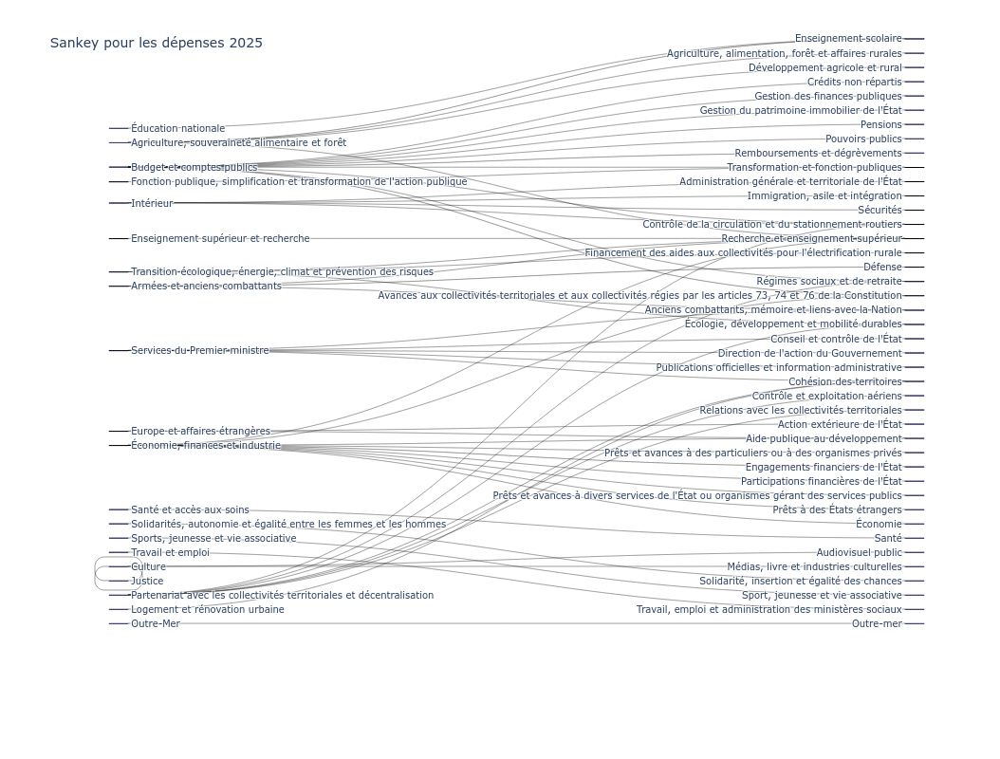

In [47]:
# on produit le diagramme de Sankey
# tout se passe dans la constitution du dictionnaire mis dans l'argument "link"

import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = labels,
      color = "blue"
    ),
    link = dict(
      source = [labels.index(x) for x in depenses["Ministère"]],  # indices des noeuds de départ dans la liste des labels
      target = [labels.index(x) for x in depenses["Mission"]],  # indices des noeuds d’arrivée dans la liste des labels
      value = depenses["AE  PLF"]  # valeurs à représenter
  ))])

fig.update_layout(title_text="Sankey pour les dépenses 2025", font_size=10, height=800)
fig.show()

In [50]:
recettes = pd.read_csv("./data/plf25-recettes-du-budget-general.csv", sep=";", usecols=["Type de recettes", "Libellé", "Montant Recettes PLF"])
recettes["Libellé"] = recettes["Libellé"].combine(recettes["Montant Recettes PLF"], lambda x, y: "Divers" if y < 1e9 else x)
recettes = recettes.groupby(["Type de recettes", "Libellé"], as_index=False)["Montant Recettes PLF"].sum()
recettes

,Type de recettes,Libellé,Montant Recettes PLF
0,Prélèvement sur les recettes de l'État au prof...,Prélèvement sur les recettes de l'État au prof...,2.332086e+10
1,Prélèvements sur les recettes de l'État au pro...,Divers,4.602797e+09
2,Prélèvements sur les recettes de l'État au pro...,Dotation de compensation de la réforme de la t...,1.204316e+09
3,Prélèvements sur les recettes de l'État au pro...,Prélèvement sur les recettes de l'État au prof...,6.846000e+09
4,Prélèvements sur les recettes de l'État au pro...,Prélèvement sur les recettes de l'État au titr...,4.291099e+09
5,Prélèvements sur les recettes de l'État au pro...,Prélèvement sur les recettes de l'État au titr...,2.724469e+10
6,Recettes fiscales,Autres impôts directs perçus par voie d'émissi...,2.898900e+09
7,Recettes fiscales,Autres taxes,4.406000e+09
8,Recettes fiscales,Autres taxes intérieures,7.813756e+09
9,Recettes fiscales,Contribution différentielle applicable à certa...,2.000000e+09


In [52]:
labels = list(recettes["Type de recettes"].unique()) + list(recettes["Libellé"].unique())
labels

["Prélèvement sur les recettes de l'État au profit de l'Union européenne",
 "Prélèvements sur les recettes de l'État au profit des collectivités territoriales",
 'Recettes fiscales',
 'Recettes non fiscales',
 "Prélèvement sur les recettes de l'État au profit du budget de l'Union européenne",
 'Divers',
 'Dotation de compensation de la réforme de la taxe professionnelle (départements)',
 "Prélèvement sur les recettes de l'État au profit du Fonds de compensation pour la taxe sur la valeur ajoutée (FCTVA)",
 "Prélèvement sur les recettes de l'État au titre de la compensation de la réduction de 50 % des valeurs locatives de taxe foncière sur les propriétés bâties et de cotisation foncière des entreprises des locaux industriels",
 "Prélèvement sur les recettes de l'État au titre de la dotation globale de fonctionnement",
 "Autres impôts directs perçus par voie d'émission de rôles",
 'Autres taxes',
 'Autres taxes intérieures',
 'Contribution différentielle applicable à certains contribuabl

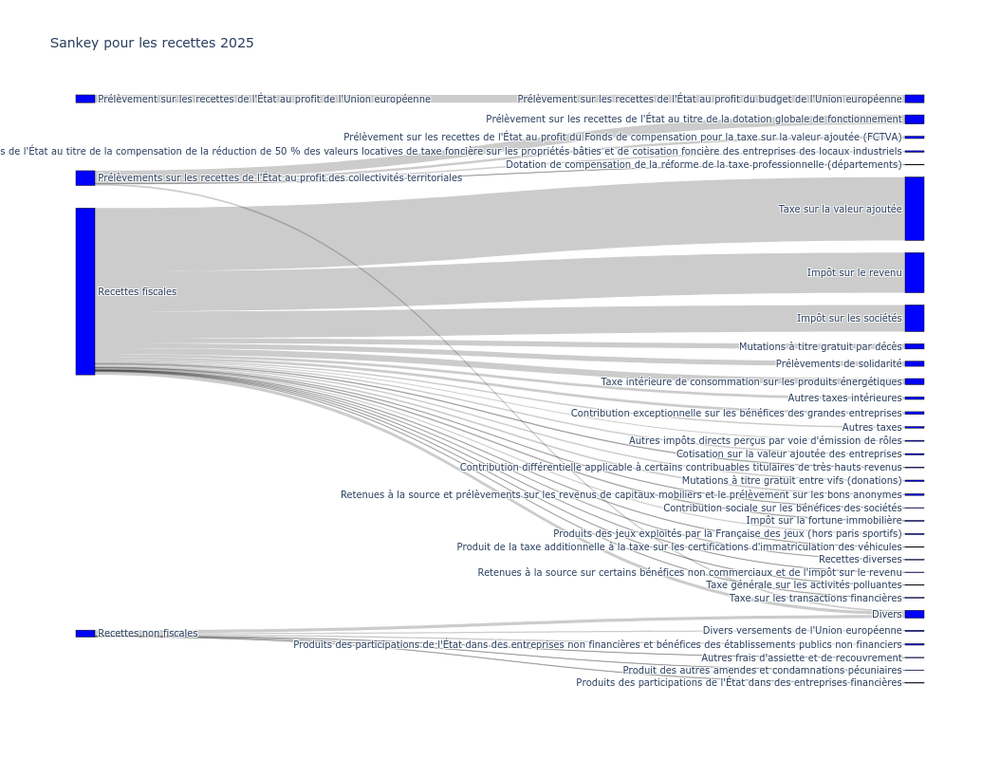

In [54]:
# on produit le diagramme de Sankey
# tout se passe dans la constitution du dictionnaire mis dans l'argument "link"

import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = labels,
      color = "blue"
    ),
    link = dict(
      source = [labels.index(x) for x in recettes["Type de recettes"]],  # indices des noeuds de départ dans la liste des labels
      target = [labels.index(x) for x in recettes["Libellé"]],  # indices des noeuds d’arrivée dans la liste des labels
      value = recettes["Montant Recettes PLF"]  # valeurs à représenter
  ))])

fig.update_layout(title_text="Sankey pour les recettes 2025", font_size=10, height=800)
fig.show()